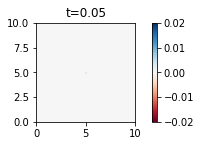

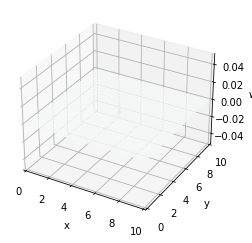

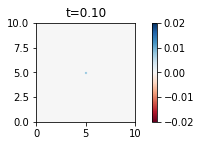

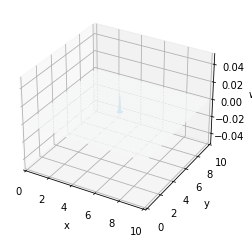

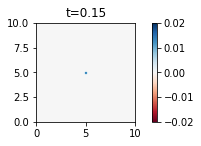

...

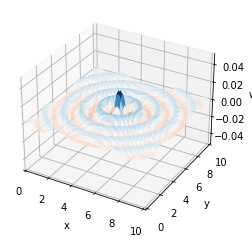

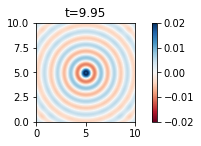

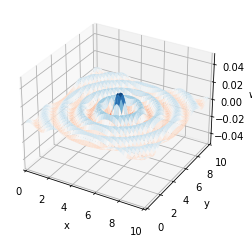

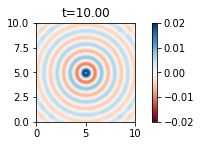

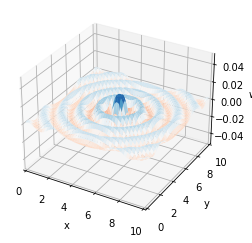

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

#Solving a PDE
# Equation
# wtt = c^2 wxx + c^2 wyy + f

# Domain
# Space
Lx = 10
Ly = 10
dx = 0.1
dy = dx
nx = int(Lx/dx)
ny = int(Ly/dy)
x = np.linspace(0, Lx, nx)
y = np.linspace(0, Ly, ny)

# Time
T = 10

# Field variables
# Variables
wn = np.zeros((nx, ny))
wnm1 = wn  # w at time n-1
wnp1 = wn  # w at time n+1

# Parameters
CFL = 0.5
c = 1
dt = CFL*dx/c

# Initial Conditions

# Time Stepping loop
t = 0

while(t < T):
    # Reflecting boundary conditions
#     wn[:, [0, -1]] = 0
#     wn[[0, -1], :] = 0

    # Absorbing boundary conditions
    wnp1[0, :] = wn[1, :] + ((CFL-1)/(CFL+1))* (wnp1[1, :]-wn[0, :])
    wnp1[-1, :] = wn[-2, :] + ((CFL-1)/(CFL+1))*(wnp1[-2, :]-wn[-1, :])
    wnp1[:, 0] = wn[:, 1] + ((CFL-1)/(CFL+1))*(wnp1[:, 1]-wn[:, 0])
    wnp1[:, -1] = wn[:, -2] + ((CFL-1)/(CFL+1))*(wnp1[:, -2]-wn[:, -1])

    # Solution
    t = t+dt
    wnm1 = wn.copy()
    wn = wnp1.copy()  # Saving current and previous arrays

    # Source
    wn[50, 50] = dt**2*20*np.sin(30*np.pi*t/20)

    for i in range(1, nx-1):
        for j in range(1, ny-1):
            wnp1[i, j] = 2*wn[i, j]-wnm1[i, j] + CFL**2 * \
                (wn[i+1, j]+wn[i, j+1]-4*wn[i, j]+wn[i-1, j]+wn[i, j-1])

# Check convergence
# Visualize at selected steps
    plt.subplot(2, 1, 1)
    im = plt.imshow(wn.T, extent=[0, Lx, 0, Ly], cmap='RdBu', vmin=-0.02, vmax=0.02)
    plt.title('t={:.2f}'.format(t))
    plt.clim([-0.02, 0.02])
    plt.colorbar(im)


    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    X, Y = np.meshgrid(x, y)
    ax.plot_surface(X, Y, wn.T, cmap='RdBu', vmin=-0.02, vmax=0.02)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('w')
    ax.set_xlim3d(0, Lx)
    ax.set_ylim3d(0, Ly)
    ax.set_zlim3d(-0.05, 0.05)
    plt.show()
    plt.pause(0.05)

